# Image Segmentation - part 4

# K-means clustering

Following the exercises from this [article](https://thepythoncode.com/article/kmeans-for-image-segmentation-opencv-python).

Image Segmentation is an important step in image processing, as real-world images don't always contain only one object that we wanna classify. For instance, for self-driving cars, the image would contain the road, cars, pedestrians, etc. So we may need to use segmentation here to separate objects and analyze each object individually (i.e., image classification) to check what it is.

K-Means clustering is an unsupervised machine learning algorithm that aims to partition N observations into K clusters in which each observation belongs to the cluster with the nearest mean. A cluster refers to a collection of data points aggregated together because of certain similarities. For image segmentation, clusters here are different image colors.

In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

We are going to use the cv2.kmeans() function, which takes a 2D array as input, and since our original image is 3D (width, height, and depth of 3 RGB values), we need to flatten the height and width into a single vector of pixels (3 RGB values)

In [6]:
list_files = os.listdir('images')
image_pixel_values = []
for filename in list_files:
    print(filename)
    image = cv2.imread('images/' + filename)
    # convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # reshape the image to a 2D array of pixels and 3 color values (RGB)
    pixel_values = image.reshape((-1, 3))
    # convert to float
    pixel_values = np.float32(pixel_values)
    image_pixel_values.append(pixel_values)


952430_sat_61.jpg
961407_sat_54.jpg
96870_sat_88.jpg
986342_sat_53.jpg
998002_sat_22.jpg
w_r_119_.jpg
w_r_18_.jpg
w_r_251_.jpg
w_r_299_.jpg
w_r_99_.jpg


The K-means algorithm stops when none of the cluster assignments change, but since this is a large number of data points, it'll take a lot of time to process, we are going to stop either when some number of iterations is exceeded (say 100), or if the clusters move less than some epsilon value (let's pick 0.2 here).

In [8]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

First we are going to try and use 2 clusters to separate the images in forest/soil and sea/objects

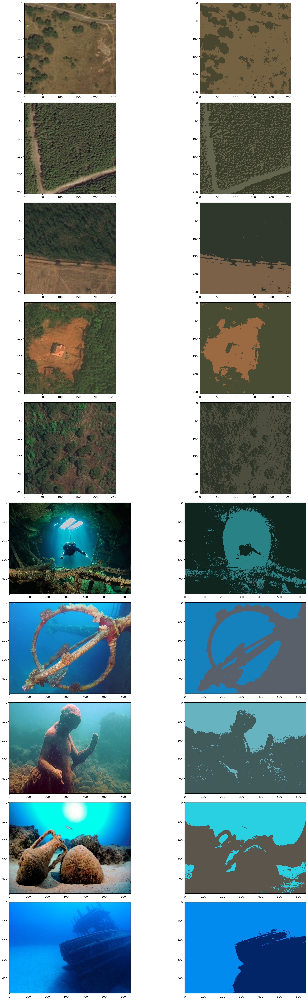

In [12]:
# setting the plot size
fig,axes = plt.subplots(nrows = 10, ncols = 2, figsize=(20,50))

k = 2
list_files = os.listdir('images')
for idx,filename in enumerate(list_files):
    image = cv2.imread('images/' + filename)
    # convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # reshape the image to a 2D array of pixels and 3 color values (RGB)
    pixel_values = image.reshape((-1, 3))
    # convert to float
    pixel_values = np.float32(pixel_values)
    _, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
    # convert back to 8 bit values
    centers = np.uint8(centers)
    # flatten the labels array
    labels = labels.flatten()
    # convert all pixels to the color of the centroids
    segmented_image = centers[labels.flatten()]
    # reshape back to the original image dimension
    segmented_image = segmented_image.reshape(image.shape)
    # show the image
    axes[idx,0].imshow(image)
    axes[idx,1].imshow(segmented_image)

plt.tight_layout()

Some of the background gets mixed up in the clusters, let's try k = 3 now.

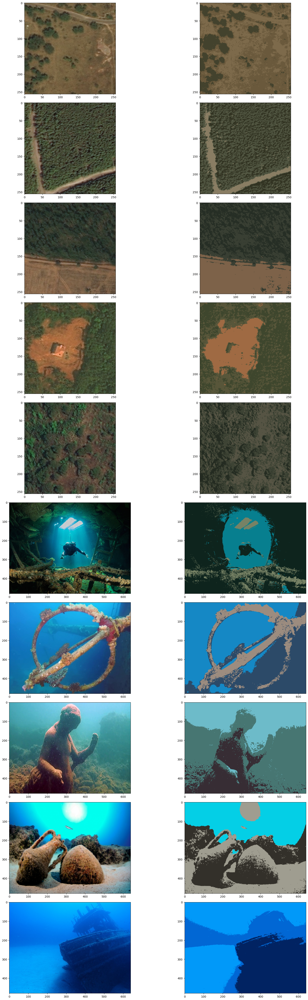

In [13]:
# setting the plot size
fig,axes = plt.subplots(nrows = 10, ncols = 2, figsize=(20,50))
k = 3
list_files = os.listdir('images')
for idx,filename in enumerate(list_files):
    image = cv2.imread('images/' + filename)
    # convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # reshape the image to a 2D array of pixels and 3 color values (RGB)
    pixel_values = image.reshape((-1, 3))
    # convert to float
    pixel_values = np.float32(pixel_values)
    _, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
    # convert back to 8 bit values
    centers = np.uint8(centers)
    # flatten the labels array
    labels = labels.flatten()
    # convert all pixels to the color of the centroids
    segmented_image = centers[labels.flatten()]
    # reshape back to the original image dimension
    segmented_image = segmented_image.reshape(image.shape)
    # show the image
    axes[idx,0].imshow(image)
    axes[idx,1].imshow(segmented_image)

plt.tight_layout()

https://thepythoncode.com/article/image-segmentation-using-huggingface-transformers-python